In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [336]:
nbat = pd.read_csv('nbat.csv')

In [337]:
nbat.head()

,Unnamed: 0,index,Innings Player,Innings Runs Scored,Innings Minutes Batted,Innings Batted Flag,Innings Not Out Flag,Innings Balls Faced,Innings Boundary Fours,Innings Boundary Sixes,Innings Batting Strike Rate,Innings Number,Opposition,Ground,Innings Date,Country,50's,100's,Innings Runs Scored Buckets,Last Name
0,0,4673,DA Warner,179,186,1.0,0.0,128,19,5,139,1,v Pakistan,Adelaide,2017/01/26,Australia,0.0,1.0,150199,Warner
1,1,4674,DA Warner,178,164,1.0,0.0,133,19,5,133,1,v Afghanistan,Perth,2015/03/04,Australia,0.0,1.0,150199,Warner
2,2,4676,DA Warner,173,218,1.0,0.0,136,24,0,127,2,v South Africa,Cape Town,2016/10/12,Australia,0.0,1.0,150199,Warner
3,3,4678,DA Warner,166,184,1.0,0.0,147,14,5,112,1,v Bangladesh,Nottingham,2019/06/20,Australia,0.0,1.0,150199,Warner
4,4,4680,SPD Smith,164,206,1.0,0.0,157,14,4,104,1,v New Zealand,Sydney,2016/12/04,Australia,0.0,1.0,150199,Smith


In [338]:
nbat.drop(columns=['Unnamed: 0','index','Last Name','Innings Runs Scored Buckets'],inplace=True)

In [339]:
nbat.head()

,Innings Player,Innings Runs Scored,Innings Minutes Batted,Innings Batted Flag,Innings Not Out Flag,Innings Balls Faced,Innings Boundary Fours,Innings Boundary Sixes,Innings Batting Strike Rate,Innings Number,Opposition,Ground,Innings Date,Country,50's,100's
0,DA Warner,179,186,1.0,0.0,128,19,5,139,1,v Pakistan,Adelaide,2017/01/26,Australia,0.0,1.0
1,DA Warner,178,164,1.0,0.0,133,19,5,133,1,v Afghanistan,Perth,2015/03/04,Australia,0.0,1.0
2,DA Warner,173,218,1.0,0.0,136,24,0,127,2,v South Africa,Cape Town,2016/10/12,Australia,0.0,1.0
3,DA Warner,166,184,1.0,0.0,147,14,5,112,1,v Bangladesh,Nottingham,2019/06/20,Australia,0.0,1.0
4,SPD Smith,164,206,1.0,0.0,157,14,4,104,1,v New Zealand,Sydney,2016/12/04,Australia,0.0,1.0


### Last 5 matches average

In [340]:
nbat['Innings Date'] = pd.to_datetime(nbat['Innings Date'])

In [341]:
nbat.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5559 entries, 0 to 5558
Data columns (total 16 columns):
 #   Column                       Non-Null Count  Dtype         
---  ------                       --------------  -----         
 0   Innings Player               5559 non-null   object        
 1   Innings Runs Scored          5559 non-null   int64         
 2   Innings Minutes Batted       5559 non-null   int64         
 3   Innings Batted Flag          5559 non-null   float64       
 4   Innings Not Out Flag         5559 non-null   float64       
 5   Innings Balls Faced          5559 non-null   int64         
 6   Innings Boundary Fours       5559 non-null   int64         
 7   Innings Boundary Sixes       5559 non-null   int64         
 8   Innings Batting Strike Rate  5559 non-null   int64         
 9   Innings Number               5559 non-null   int64         
 10  Opposition                   5559 non-null   object        
 11  Ground                       5559 non-null 

In [342]:
nbat['date_year'] = nbat['Innings Date'].dt.year

nbat.head()

,Innings Player,Innings Runs Scored,Innings Minutes Batted,Innings Batted Flag,Innings Not Out Flag,Innings Balls Faced,Innings Boundary Fours,Innings Boundary Sixes,Innings Batting Strike Rate,Innings Number,Opposition,Ground,Innings Date,Country,50's,100's,date_year
0,DA Warner,179,186,1.0,0.0,128,19,5,139,1,v Pakistan,Adelaide,2017-01-26,Australia,0.0,1.0,2017
1,DA Warner,178,164,1.0,0.0,133,19,5,133,1,v Afghanistan,Perth,2015-03-04,Australia,0.0,1.0,2015
2,DA Warner,173,218,1.0,0.0,136,24,0,127,2,v South Africa,Cape Town,2016-10-12,Australia,0.0,1.0,2016
3,DA Warner,166,184,1.0,0.0,147,14,5,112,1,v Bangladesh,Nottingham,2019-06-20,Australia,0.0,1.0,2019
4,SPD Smith,164,206,1.0,0.0,157,14,4,104,1,v New Zealand,Sydney,2016-12-04,Australia,0.0,1.0,2016


In [343]:
nbat['date_month'] = nbat['Innings Date'].dt.month
nbat['date_day'] = nbat['Innings Date'].dt.day

nbat.head()

,Innings Player,Innings Runs Scored,Innings Minutes Batted,Innings Batted Flag,Innings Not Out Flag,Innings Balls Faced,Innings Boundary Fours,Innings Boundary Sixes,Innings Batting Strike Rate,Innings Number,Opposition,Ground,Innings Date,Country,50's,100's,date_year,date_month,date_day
0,DA Warner,179,186,1.0,0.0,128,19,5,139,1,v Pakistan,Adelaide,2017-01-26,Australia,0.0,1.0,2017,1,26
1,DA Warner,178,164,1.0,0.0,133,19,5,133,1,v Afghanistan,Perth,2015-03-04,Australia,0.0,1.0,2015,3,4
2,DA Warner,173,218,1.0,0.0,136,24,0,127,2,v South Africa,Cape Town,2016-10-12,Australia,0.0,1.0,2016,10,12
3,DA Warner,166,184,1.0,0.0,147,14,5,112,1,v Bangladesh,Nottingham,2019-06-20,Australia,0.0,1.0,2019,6,20
4,SPD Smith,164,206,1.0,0.0,157,14,4,104,1,v New Zealand,Sydney,2016-12-04,Australia,0.0,1.0,2016,12,4


In [344]:
nbat = nbat.sort_values(by=['Innings Player', 'date_year', 'date_month', 'date_day'])

In [345]:
nbat.head(20)

,Innings Player,Innings Runs Scored,Innings Minutes Batted,Innings Batted Flag,Innings Not Out Flag,Innings Balls Faced,Innings Boundary Fours,Innings Boundary Sixes,Innings Batting Strike Rate,Innings Number,Opposition,Ground,Innings Date,Country,50's,100's,date_year,date_month,date_day
625,A Zampa,0,0,0.0,0.0,0,0,0,0,2,v New Zealand,Wellington,2016-02-06,Australia,0.0,0.0,2016,2,6
2394,A Zampa,0,0,0.0,0.0,0,0,0,0,2,v New Zealand,Wellington,2016-02-06,Australia,0.0,0.0,2016,2,6
4143,A Zampa,0,0,0.0,0.0,0,0,0,0,2,v New Zealand,Wellington,2016-02-06,Australia,0.0,0.0,2016,2,6
495,A Zampa,2,12,1.0,0.0,11,0,0,18,2,v New Zealand,Hamilton,2016-02-08,Australia,0.0,0.0,2016,2,8
2265,A Zampa,2,12,1.0,0.0,11,0,0,18,2,v New Zealand,Hamilton,2016-02-08,Australia,0.0,0.0,2016,2,8
4017,A Zampa,2,12,1.0,0.0,11,0,0,18,2,v New Zealand,Hamilton,2016-02-08,Australia,0.0,0.0,2016,2,8
627,A Zampa,0,0,0.0,0.0,0,0,0,0,2,v West Indies,Providence,2016-06-05,Australia,0.0,0.0,2016,6,5
2396,A Zampa,0,0,0.0,0.0,0,0,0,0,2,v West Indies,Providence,2016-06-05,Australia,0.0,0.0,2016,6,5
4145,A Zampa,0,0,0.0,0.0,0,0,0,0,2,v West Indies,Providence,2016-06-05,Australia,0.0,0.0,2016,6,5
555,A Zampa,0,4,1.0,0.0,1,0,0,0,2,v South Africa,Providence,2016-06-07,Australia,0.0,0.0,2016,6,7


In [346]:
nbat.reset_index(inplace=True)

In [347]:
nbat.drop('index',axis=1,inplace=True)

In [348]:
nbat.head()

,Innings Player,Innings Runs Scored,Innings Minutes Batted,Innings Batted Flag,Innings Not Out Flag,Innings Balls Faced,Innings Boundary Fours,Innings Boundary Sixes,Innings Batting Strike Rate,Innings Number,Opposition,Ground,Innings Date,Country,50's,100's,date_year,date_month,date_day
0,A Zampa,0,0,0.0,0.0,0,0,0,0,2,v New Zealand,Wellington,2016-02-06,Australia,0.0,0.0,2016,2,6
1,A Zampa,0,0,0.0,0.0,0,0,0,0,2,v New Zealand,Wellington,2016-02-06,Australia,0.0,0.0,2016,2,6
2,A Zampa,0,0,0.0,0.0,0,0,0,0,2,v New Zealand,Wellington,2016-02-06,Australia,0.0,0.0,2016,2,6
3,A Zampa,2,12,1.0,0.0,11,0,0,18,2,v New Zealand,Hamilton,2016-02-08,Australia,0.0,0.0,2016,2,8
4,A Zampa,2,12,1.0,0.0,11,0,0,18,2,v New Zealand,Hamilton,2016-02-08,Australia,0.0,0.0,2016,2,8


In [349]:
nbat['Average Runs Last 5 Matches'] = np.nan

In [350]:
nbat['Average Runs Last 5 Matches'] = np.nan

# Iterate through each player's data
for player_name in nbat['Innings Player'].unique():
    player_data = nbat[nbat['Innings Player'] == player_name]
    
    # Calculate the average runs for the last five matches
    total_matches = len(player_data)
    for i in range(total_matches):
        if i < 5:
            # For the first five matches or when there are fewer than 5 matches,
            # use the value of the last match available for that player
            nbat.at[player_data.index[i], 'Average Runs Last 5 Matches'] = player_data.iloc[min(4, total_matches - 1)]['Innings Runs Scored']
        else:
            # For subsequent matches, calculate the average of the last five matches
            nbat.at[player_data.index[i], 'Average Runs Last 5 Matches'] = np.mean(player_data.iloc[i-4:i+1]['Innings Runs Scored'])

In [351]:
nbat.sample(10)

,Innings Player,Innings Runs Scored,Innings Minutes Batted,Innings Batted Flag,Innings Not Out Flag,Innings Balls Faced,Innings Boundary Fours,Innings Boundary Sixes,Innings Batting Strike Rate,Innings Number,Opposition,Ground,Innings Date,Country,50's,100's,date_year,date_month,date_day,Average Runs Last 5 Matches
5532,V Kohli,4,0,1.0,0.0,4,1,0,100,1,v West Indies,Chennai,2019-12-15,India,0.0,0.0,2019,12,15,93.2
1282,JJ Bumrah,0,0,0.0,0.0,0,0,0,0,2,v England,Birmingham,2019-06-30,India,0.0,0.0,2019,6,30,0.0
178,AT Carey,24,43,1.0,0.0,31,5,0,77,1,v India,Sydney,2019-01-12,Australia,0.0,0.0,2019,1,12,39.4
140,A Zampa,1,4,1.0,0.0,3,0,0,33,2,v India,The Oval,2019-06-09,Australia,0.0,0.0,2019,6,9,0.6
4188,RG Sharma,104,121,1.0,0.0,92,7,5,113,1,v Bangladesh,Birmingham,2019-07-02,India,0.0,1.0,2019,7,2,102.8
483,DA Warner,109,157,1.0,0.0,120,11,2,90,1,v South Africa,Basseterre,2016-06-11,Australia,0.0,1.0,2016,6,11,44.2
5286,V Kohli,1,11,1.0,0.0,13,0,0,7,2,v Australia,Sydney,2015-03-26,India,0.0,0.0,2015,3,26,9.6
542,DA Warner,18,21,1.0,0.0,16,1,1,112,2,v New Zealand,Birmingham,2017-06-02,Australia,0.0,0.0,2017,6,2,137.0
869,GJ Maxwell,34,0,1.0,0.0,39,3,1,87,2,v England,Perth,2018-01-28,Australia,0.0,0.0,2018,1,28,22.4
3846,RG Sharma,20,57,1.0,0.0,40,2,0,50,2,v Zimbabwe,Harare,2013-07-24,India,0.0,0.0,2013,7,24,42.8


In [352]:
nbat.describe()

,Innings Runs Scored,Innings Minutes Batted,Innings Batted Flag,Innings Not Out Flag,Innings Balls Faced,Innings Boundary Fours,Innings Boundary Sixes,Innings Batting Strike Rate,Innings Number,Innings Date,50's,100's,date_year,date_month,date_day,Average Runs Last 5 Matches
count,5559.000000,5559.000000,5559.000000,5559.000000,5559.000000,5559.000000,5559.000000,5559.000000,5559.000000,5559,5559.000000,5559.000000,5559.000000,5559.000000,5559.000000,5559.000000
mean,24.361216,31.414103,0.760928,0.152725,26.323260,2.233495,0.445764,61.777298,1.484080,2015-10-16 22:07:50.156502784,0.124303,0.058644,2015.357079,5.734485,15.846915,24.508329
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2007-06-23 00:00:00,0.000000,0.000000,2007.000000,1.000000,1.000000,0.000000
25%,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2013-07-26 00:00:00,0.000000,0.000000,2013.000000,2.000000,8.000000,2.800000
50%,8.000000,9.000000,1.000000,0.000000,12.000000,1.000000,0.000000,65.000000,2.000000,2016-06-07 00:00:00,0.000000,0.000000,2016.000000,6.000000,16.000000,14.000000
75%,35.000000,42.000000,1.000000,0.000000,38.000000,3.000000,0.000000,98.000000,2.000000,2018-06-21 00:00:00,0.000000,0.000000,2018.000000,9.000000,23.000000,38.000000
max,264.000000,228.000000,1.000000,1.000000,173.000000,33.000000,16.000000,600.000000,2.000000,2020-03-13 00:00:00,1.000000,1.000000,2020.000000,12.000000,31.000000,179.200000
std,35.206972,46.948286,0.426555,0.359755,34.219883,3.565027,1.158801,57.408312,0.532219,NaN,0.329957,0.234978,3.124679,3.688045,8.663066,28.180801


### Current form

In [353]:
nbat.head()

,Innings Player,Innings Runs Scored,Innings Minutes Batted,Innings Batted Flag,Innings Not Out Flag,Innings Balls Faced,Innings Boundary Fours,Innings Boundary Sixes,Innings Batting Strike Rate,Innings Number,Opposition,Ground,Innings Date,Country,50's,100's,date_year,date_month,date_day,Average Runs Last 5 Matches
0,A Zampa,0,0,0.0,0.0,0,0,0,0,2,v New Zealand,Wellington,2016-02-06,Australia,0.0,0.0,2016,2,6,2.0
1,A Zampa,0,0,0.0,0.0,0,0,0,0,2,v New Zealand,Wellington,2016-02-06,Australia,0.0,0.0,2016,2,6,2.0
2,A Zampa,0,0,0.0,0.0,0,0,0,0,2,v New Zealand,Wellington,2016-02-06,Australia,0.0,0.0,2016,2,6,2.0
3,A Zampa,2,12,1.0,0.0,11,0,0,18,2,v New Zealand,Hamilton,2016-02-08,Australia,0.0,0.0,2016,2,8,2.0
4,A Zampa,2,12,1.0,0.0,11,0,0,18,2,v New Zealand,Hamilton,2016-02-08,Australia,0.0,0.0,2016,2,8,2.0


### Current form

In [354]:
nbat['Average Strike rate Last 5 Matches'] = np.nan

# Iterate through each player's data
for player_name in nbat['Innings Player'].unique():
    player_data = nbat[nbat['Innings Player'] == player_name]
    
    # Calculate the average runs for the last five matches
    total_matches = len(player_data)
    for i in range(total_matches):
        if i < 5:
            # For the first five matches or when there are fewer than 5 matches,
            # use the value of the last match available for that player
            nbat.at[player_data.index[i], 'Average Strike rate Last 5 Matches'] = player_data.iloc[min(4, total_matches - 1)]['Innings Batting Strike Rate']
        else:
            # For subsequent matches, calculate the average of the last five matches
            nbat.at[player_data.index[i], 'Average Strike rate Last 5 Matches'] = np.mean(player_data.iloc[i-4:i+1]['Innings Batting Strike Rate'])

In [355]:
nbat.head()

,Innings Player,Innings Runs Scored,Innings Minutes Batted,Innings Batted Flag,Innings Not Out Flag,Innings Balls Faced,Innings Boundary Fours,Innings Boundary Sixes,Innings Batting Strike Rate,Innings Number,...,Ground,Innings Date,Country,50's,100's,date_year,date_month,date_day,Average Runs Last 5 Matches,Average Strike rate Last 5 Matches
0,A Zampa,0,0,0.0,0.0,0,0,0,0,2,...,Wellington,2016-02-06,Australia,0.0,0.0,2016,2,6,2.0,18.0
1,A Zampa,0,0,0.0,0.0,0,0,0,0,2,...,Wellington,2016-02-06,Australia,0.0,0.0,2016,2,6,2.0,18.0
2,A Zampa,0,0,0.0,0.0,0,0,0,0,2,...,Wellington,2016-02-06,Australia,0.0,0.0,2016,2,6,2.0,18.0
3,A Zampa,2,12,1.0,0.0,11,0,0,18,2,...,Hamilton,2016-02-08,Australia,0.0,0.0,2016,2,8,2.0,18.0
4,A Zampa,2,12,1.0,0.0,11,0,0,18,2,...,Hamilton,2016-02-08,Australia,0.0,0.0,2016,2,8,2.0,18.0


In [356]:
nbat['Total Boundary'] = nbat['Innings Boundary Fours'] + nbat['Innings Boundary Sixes']

In [357]:
nbat.head()

,Innings Player,Innings Runs Scored,Innings Minutes Batted,Innings Batted Flag,Innings Not Out Flag,Innings Balls Faced,Innings Boundary Fours,Innings Boundary Sixes,Innings Batting Strike Rate,Innings Number,...,Innings Date,Country,50's,100's,date_year,date_month,date_day,Average Runs Last 5 Matches,Average Strike rate Last 5 Matches,Total Boundary
0,A Zampa,0,0,0.0,0.0,0,0,0,0,2,...,2016-02-06,Australia,0.0,0.0,2016,2,6,2.0,18.0,0
1,A Zampa,0,0,0.0,0.0,0,0,0,0,2,...,2016-02-06,Australia,0.0,0.0,2016,2,6,2.0,18.0,0
2,A Zampa,0,0,0.0,0.0,0,0,0,0,2,...,2016-02-06,Australia,0.0,0.0,2016,2,6,2.0,18.0,0
3,A Zampa,2,12,1.0,0.0,11,0,0,18,2,...,2016-02-08,Australia,0.0,0.0,2016,2,8,2.0,18.0,0
4,A Zampa,2,12,1.0,0.0,11,0,0,18,2,...,2016-02-08,Australia,0.0,0.0,2016,2,8,2.0,18.0,0


In [358]:
nbat.drop(columns=['Innings Boundary Fours','Innings Boundary Sixes'],inplace=True)

In [359]:
nbat.head()

,Innings Player,Innings Runs Scored,Innings Minutes Batted,Innings Batted Flag,Innings Not Out Flag,Innings Balls Faced,Innings Batting Strike Rate,Innings Number,Opposition,Ground,Innings Date,Country,50's,100's,date_year,date_month,date_day,Average Runs Last 5 Matches,Average Strike rate Last 5 Matches,Total Boundary
0,A Zampa,0,0,0.0,0.0,0,0,2,v New Zealand,Wellington,2016-02-06,Australia,0.0,0.0,2016,2,6,2.0,18.0,0
1,A Zampa,0,0,0.0,0.0,0,0,2,v New Zealand,Wellington,2016-02-06,Australia,0.0,0.0,2016,2,6,2.0,18.0,0
2,A Zampa,0,0,0.0,0.0,0,0,2,v New Zealand,Wellington,2016-02-06,Australia,0.0,0.0,2016,2,6,2.0,18.0,0
3,A Zampa,2,12,1.0,0.0,11,18,2,v New Zealand,Hamilton,2016-02-08,Australia,0.0,0.0,2016,2,8,2.0,18.0,0
4,A Zampa,2,12,1.0,0.0,11,18,2,v New Zealand,Hamilton,2016-02-08,Australia,0.0,0.0,2016,2,8,2.0,18.0,0


In [360]:
nbat.drop(columns=['Innings Batted Flag'],inplace=True)

In [361]:
nbat.head()

,Innings Player,Innings Runs Scored,Innings Minutes Batted,Innings Not Out Flag,Innings Balls Faced,Innings Batting Strike Rate,Innings Number,Opposition,Ground,Innings Date,Country,50's,100's,date_year,date_month,date_day,Average Runs Last 5 Matches,Average Strike rate Last 5 Matches,Total Boundary
0,A Zampa,0,0,0.0,0,0,2,v New Zealand,Wellington,2016-02-06,Australia,0.0,0.0,2016,2,6,2.0,18.0,0
1,A Zampa,0,0,0.0,0,0,2,v New Zealand,Wellington,2016-02-06,Australia,0.0,0.0,2016,2,6,2.0,18.0,0
2,A Zampa,0,0,0.0,0,0,2,v New Zealand,Wellington,2016-02-06,Australia,0.0,0.0,2016,2,6,2.0,18.0,0
3,A Zampa,2,12,0.0,11,18,2,v New Zealand,Hamilton,2016-02-08,Australia,0.0,0.0,2016,2,8,2.0,18.0,0
4,A Zampa,2,12,0.0,11,18,2,v New Zealand,Hamilton,2016-02-08,Australia,0.0,0.0,2016,2,8,2.0,18.0,0


In [362]:
nbat.drop(columns=['Innings Number'],inplace=True)

In [363]:
nbat.head()

,Innings Player,Innings Runs Scored,Innings Minutes Batted,Innings Not Out Flag,Innings Balls Faced,Innings Batting Strike Rate,Opposition,Ground,Innings Date,Country,50's,100's,date_year,date_month,date_day,Average Runs Last 5 Matches,Average Strike rate Last 5 Matches,Total Boundary
0,A Zampa,0,0,0.0,0,0,v New Zealand,Wellington,2016-02-06,Australia,0.0,0.0,2016,2,6,2.0,18.0,0
1,A Zampa,0,0,0.0,0,0,v New Zealand,Wellington,2016-02-06,Australia,0.0,0.0,2016,2,6,2.0,18.0,0
2,A Zampa,0,0,0.0,0,0,v New Zealand,Wellington,2016-02-06,Australia,0.0,0.0,2016,2,6,2.0,18.0,0
3,A Zampa,2,12,0.0,11,18,v New Zealand,Hamilton,2016-02-08,Australia,0.0,0.0,2016,2,8,2.0,18.0,0
4,A Zampa,2,12,0.0,11,18,v New Zealand,Hamilton,2016-02-08,Australia,0.0,0.0,2016,2,8,2.0,18.0,0


In [364]:
nbat.drop(columns=['Innings Date'],inplace=True)

In [365]:
nbat.head()

,Innings Player,Innings Runs Scored,Innings Minutes Batted,Innings Not Out Flag,Innings Balls Faced,Innings Batting Strike Rate,Opposition,Ground,Country,50's,100's,date_year,date_month,date_day,Average Runs Last 5 Matches,Average Strike rate Last 5 Matches,Total Boundary
0,A Zampa,0,0,0.0,0,0,v New Zealand,Wellington,Australia,0.0,0.0,2016,2,6,2.0,18.0,0
1,A Zampa,0,0,0.0,0,0,v New Zealand,Wellington,Australia,0.0,0.0,2016,2,6,2.0,18.0,0
2,A Zampa,0,0,0.0,0,0,v New Zealand,Wellington,Australia,0.0,0.0,2016,2,6,2.0,18.0,0
3,A Zampa,2,12,0.0,11,18,v New Zealand,Hamilton,Australia,0.0,0.0,2016,2,8,2.0,18.0,0
4,A Zampa,2,12,0.0,11,18,v New Zealand,Hamilton,Australia,0.0,0.0,2016,2,8,2.0,18.0,0


In [366]:
nbat['boundary_per_ball'] = nbat['Total Boundary']/nbat['Innings Balls Faced']

In [367]:
nbat.head()

,Innings Player,Innings Runs Scored,Innings Minutes Batted,Innings Not Out Flag,Innings Balls Faced,Innings Batting Strike Rate,Opposition,Ground,Country,50's,100's,date_year,date_month,date_day,Average Runs Last 5 Matches,Average Strike rate Last 5 Matches,Total Boundary,boundary_per_ball
0,A Zampa,0,0,0.0,0,0,v New Zealand,Wellington,Australia,0.0,0.0,2016,2,6,2.0,18.0,0,NaN
1,A Zampa,0,0,0.0,0,0,v New Zealand,Wellington,Australia,0.0,0.0,2016,2,6,2.0,18.0,0,NaN
2,A Zampa,0,0,0.0,0,0,v New Zealand,Wellington,Australia,0.0,0.0,2016,2,6,2.0,18.0,0,NaN
3,A Zampa,2,12,0.0,11,18,v New Zealand,Hamilton,Australia,0.0,0.0,2016,2,8,2.0,18.0,0,0.0
4,A Zampa,2,12,0.0,11,18,v New Zealand,Hamilton,Australia,0.0,0.0,2016,2,8,2.0,18.0,0,0.0


In [368]:
nbat['boundary_per_ball'] = nbat['boundary_per_ball'].fillna(0)

In [369]:
nbat.head()

,Innings Player,Innings Runs Scored,Innings Minutes Batted,Innings Not Out Flag,Innings Balls Faced,Innings Batting Strike Rate,Opposition,Ground,Country,50's,100's,date_year,date_month,date_day,Average Runs Last 5 Matches,Average Strike rate Last 5 Matches,Total Boundary,boundary_per_ball
0,A Zampa,0,0,0.0,0,0,v New Zealand,Wellington,Australia,0.0,0.0,2016,2,6,2.0,18.0,0,0.0
1,A Zampa,0,0,0.0,0,0,v New Zealand,Wellington,Australia,0.0,0.0,2016,2,6,2.0,18.0,0,0.0
2,A Zampa,0,0,0.0,0,0,v New Zealand,Wellington,Australia,0.0,0.0,2016,2,6,2.0,18.0,0,0.0
3,A Zampa,2,12,0.0,11,18,v New Zealand,Hamilton,Australia,0.0,0.0,2016,2,8,2.0,18.0,0,0.0
4,A Zampa,2,12,0.0,11,18,v New Zealand,Hamilton,Australia,0.0,0.0,2016,2,8,2.0,18.0,0,0.0


In [370]:
nbat.describe()

,Innings Runs Scored,Innings Minutes Batted,Innings Not Out Flag,Innings Balls Faced,Innings Batting Strike Rate,50's,100's,date_year,date_month,date_day,Average Runs Last 5 Matches,Average Strike rate Last 5 Matches,Total Boundary,boundary_per_ball
count,5559.000000,5559.000000,5559.000000,5559.000000,5559.000000,5559.000000,5559.000000,5559.000000,5559.000000,5559.000000,5559.000000,5559.000000,5559.000000,5559.000000
mean,24.361216,31.414103,0.152725,26.323260,61.777298,0.124303,0.058644,2015.357079,5.734485,15.846915,24.508329,61.972909,2.679259,0.067175
std,35.206972,46.948286,0.359755,34.219883,57.408312,0.329957,0.234978,3.124679,3.688045,8.663066,28.180801,44.466448,4.282678,0.093739
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2007.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2013.000000,2.000000,8.000000,2.800000,28.800000,0.000000,0.000000
50%,8.000000,9.000000,0.000000,12.000000,65.000000,0.000000,0.000000,2016.000000,6.000000,16.000000,14.000000,62.400000,1.000000,0.038462
75%,35.000000,42.000000,0.000000,38.000000,98.000000,0.000000,0.000000,2018.000000,9.000000,23.000000,38.000000,90.800000,4.000000,0.111111
max,264.000000,228.000000,1.000000,173.000000,600.000000,1.000000,1.000000,2020.000000,12.000000,31.000000,179.200000,370.000000,42.000000,1.000000


In [371]:
nbat.head()

,Innings Player,Innings Runs Scored,Innings Minutes Batted,Innings Not Out Flag,Innings Balls Faced,Innings Batting Strike Rate,Opposition,Ground,Country,50's,100's,date_year,date_month,date_day,Average Runs Last 5 Matches,Average Strike rate Last 5 Matches,Total Boundary,boundary_per_ball
0,A Zampa,0,0,0.0,0,0,v New Zealand,Wellington,Australia,0.0,0.0,2016,2,6,2.0,18.0,0,0.0
1,A Zampa,0,0,0.0,0,0,v New Zealand,Wellington,Australia,0.0,0.0,2016,2,6,2.0,18.0,0,0.0
2,A Zampa,0,0,0.0,0,0,v New Zealand,Wellington,Australia,0.0,0.0,2016,2,6,2.0,18.0,0,0.0
3,A Zampa,2,12,0.0,11,18,v New Zealand,Hamilton,Australia,0.0,0.0,2016,2,8,2.0,18.0,0,0.0
4,A Zampa,2,12,0.0,11,18,v New Zealand,Hamilton,Australia,0.0,0.0,2016,2,8,2.0,18.0,0,0.0


In [372]:
nbat.describe()

,Innings Runs Scored,Innings Minutes Batted,Innings Not Out Flag,Innings Balls Faced,Innings Batting Strike Rate,50's,100's,date_year,date_month,date_day,Average Runs Last 5 Matches,Average Strike rate Last 5 Matches,Total Boundary,boundary_per_ball
count,5559.000000,5559.000000,5559.000000,5559.000000,5559.000000,5559.000000,5559.000000,5559.000000,5559.000000,5559.000000,5559.000000,5559.000000,5559.000000,5559.000000
mean,24.361216,31.414103,0.152725,26.323260,61.777298,0.124303,0.058644,2015.357079,5.734485,15.846915,24.508329,61.972909,2.679259,0.067175
std,35.206972,46.948286,0.359755,34.219883,57.408312,0.329957,0.234978,3.124679,3.688045,8.663066,28.180801,44.466448,4.282678,0.093739
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2007.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2013.000000,2.000000,8.000000,2.800000,28.800000,0.000000,0.000000
50%,8.000000,9.000000,0.000000,12.000000,65.000000,0.000000,0.000000,2016.000000,6.000000,16.000000,14.000000,62.400000,1.000000,0.038462
75%,35.000000,42.000000,0.000000,38.000000,98.000000,0.000000,0.000000,2018.000000,9.000000,23.000000,38.000000,90.800000,4.000000,0.111111
max,264.000000,228.000000,1.000000,173.000000,600.000000,1.000000,1.000000,2020.000000,12.000000,31.000000,179.200000,370.000000,42.000000,1.000000


In [373]:
nbat['Average Innings Minutes Batted 5 match'] = np.nan

# Iterate through each player's data
for player_name in nbat['Innings Player'].unique():
    player_data = nbat[nbat['Innings Player'] == player_name]
    
    # Calculate the average runs for the last five matches
    total_matches = len(player_data)
    for i in range(total_matches):
        if i < 5:
            # For the first five matches or when there are fewer than 5 matches,
            # use the value of the last match available for that player
            nbat.at[player_data.index[i], 'Average Innings Minutes Batted 5 match'] = player_data.iloc[min(4, total_matches - 1)]['Innings Minutes Batted']
        else:
            # For subsequent matches, calculate the average of the last five matches
            nbat.at[player_data.index[i], 'Average Innings Minutes Batted 5 match'] = np.mean(player_data.iloc[i-4:i+1]['Innings Minutes Batted'])

In [374]:
nbat['Average balls faced 5 match'] = np.nan

# Iterate through each player's data
for player_name in nbat['Innings Player'].unique():
    player_data = nbat[nbat['Innings Player'] == player_name]
    
    # Calculate the average runs for the last five matches
    total_matches = len(player_data)
    for i in range(total_matches):
        if i < 5:
            # For the first five matches or when there are fewer than 5 matches,
            # use the value of the last match available for that player
            nbat.at[player_data.index[i], 'Average balls faced 5 match'] = player_data.iloc[min(4, total_matches - 1)]['Innings Balls Faced']
        else:
            # For subsequent matches, calculate the average of the last five matches
            nbat.at[player_data.index[i], 'Average balls faced 5 match'] = np.mean(player_data.iloc[i-4:i+1]['Innings Balls Faced'])

In [375]:
nbat.head()

,Innings Player,Innings Runs Scored,Innings Minutes Batted,Innings Not Out Flag,Innings Balls Faced,Innings Batting Strike Rate,Opposition,Ground,Country,50's,100's,date_year,date_month,date_day,Average Runs Last 5 Matches,Average Strike rate Last 5 Matches,Total Boundary,boundary_per_ball,Average Innings Minutes Batted 5 match,Average balls faced 5 match
0,A Zampa,0,0,0.0,0,0,v New Zealand,Wellington,Australia,0.0,0.0,2016,2,6,2.0,18.0,0,0.0,12.0,11.0
1,A Zampa,0,0,0.0,0,0,v New Zealand,Wellington,Australia,0.0,0.0,2016,2,6,2.0,18.0,0,0.0,12.0,11.0
2,A Zampa,0,0,0.0,0,0,v New Zealand,Wellington,Australia,0.0,0.0,2016,2,6,2.0,18.0,0,0.0,12.0,11.0
3,A Zampa,2,12,0.0,11,18,v New Zealand,Hamilton,Australia,0.0,0.0,2016,2,8,2.0,18.0,0,0.0,12.0,11.0
4,A Zampa,2,12,0.0,11,18,v New Zealand,Hamilton,Australia,0.0,0.0,2016,2,8,2.0,18.0,0,0.0,12.0,11.0


In [376]:
nbat.drop(columns=['Innings Minutes Batted','Innings Balls Faced','Innings Not Out Flag'],inplace=True)

In [377]:
nbat.head()

,Innings Player,Innings Runs Scored,Innings Batting Strike Rate,Opposition,Ground,Country,50's,100's,date_year,date_month,date_day,Average Runs Last 5 Matches,Average Strike rate Last 5 Matches,Total Boundary,boundary_per_ball,Average Innings Minutes Batted 5 match,Average balls faced 5 match
0,A Zampa,0,0,v New Zealand,Wellington,Australia,0.0,0.0,2016,2,6,2.0,18.0,0,0.0,12.0,11.0
1,A Zampa,0,0,v New Zealand,Wellington,Australia,0.0,0.0,2016,2,6,2.0,18.0,0,0.0,12.0,11.0
2,A Zampa,0,0,v New Zealand,Wellington,Australia,0.0,0.0,2016,2,6,2.0,18.0,0,0.0,12.0,11.0
3,A Zampa,2,18,v New Zealand,Hamilton,Australia,0.0,0.0,2016,2,8,2.0,18.0,0,0.0,12.0,11.0
4,A Zampa,2,18,v New Zealand,Hamilton,Australia,0.0,0.0,2016,2,8,2.0,18.0,0,0.0,12.0,11.0


In [378]:
nbat['50s or 100s'] = np.nan

# Iterate through each player's data
for player_name in nbat['Innings Player'].unique():
    player_data = nbat[nbat['Innings Player'] == player_name]
    
    # Calculate the average runs for the last five matches
    total_matches = len(player_data)
    for i in range(total_matches):
        if i < 5:
            # For the first five matches or when there are fewer than 5 matches,
            # use the value of the last match available for that player
            nbat['50s or 100s'] =0
        else:
            # For subsequent matches, calculate the average of the last five matches
                nbat['50s or 100s'] = np.where(nbat['100\'s'] == 1, 2, 
                                           np.where(nbat['50\'s'] == 1, 1, 0))

In [379]:
nbat.head()

,Innings Player,Innings Runs Scored,Innings Batting Strike Rate,Opposition,Ground,Country,50's,100's,date_year,date_month,date_day,Average Runs Last 5 Matches,Average Strike rate Last 5 Matches,Total Boundary,boundary_per_ball,Average Innings Minutes Batted 5 match,Average balls faced 5 match,50s or 100s
0,A Zampa,0,0,v New Zealand,Wellington,Australia,0.0,0.0,2016,2,6,2.0,18.0,0,0.0,12.0,11.0,0
1,A Zampa,0,0,v New Zealand,Wellington,Australia,0.0,0.0,2016,2,6,2.0,18.0,0,0.0,12.0,11.0,0
2,A Zampa,0,0,v New Zealand,Wellington,Australia,0.0,0.0,2016,2,6,2.0,18.0,0,0.0,12.0,11.0,0
3,A Zampa,2,18,v New Zealand,Hamilton,Australia,0.0,0.0,2016,2,8,2.0,18.0,0,0.0,12.0,11.0,0
4,A Zampa,2,18,v New Zealand,Hamilton,Australia,0.0,0.0,2016,2,8,2.0,18.0,0,0.0,12.0,11.0,0


In [380]:
nbat.drop(columns=['100\'s','50\'s'],inplace=True)

In [381]:
nbat.head()

,Innings Player,Innings Runs Scored,Innings Batting Strike Rate,Opposition,Ground,Country,date_year,date_month,date_day,Average Runs Last 5 Matches,Average Strike rate Last 5 Matches,Total Boundary,boundary_per_ball,Average Innings Minutes Batted 5 match,Average balls faced 5 match,50s or 100s
0,A Zampa,0,0,v New Zealand,Wellington,Australia,2016,2,6,2.0,18.0,0,0.0,12.0,11.0,0
1,A Zampa,0,0,v New Zealand,Wellington,Australia,2016,2,6,2.0,18.0,0,0.0,12.0,11.0,0
2,A Zampa,0,0,v New Zealand,Wellington,Australia,2016,2,6,2.0,18.0,0,0.0,12.0,11.0,0
3,A Zampa,2,18,v New Zealand,Hamilton,Australia,2016,2,8,2.0,18.0,0,0.0,12.0,11.0,0
4,A Zampa,2,18,v New Zealand,Hamilton,Australia,2016,2,8,2.0,18.0,0,0.0,12.0,11.0,0


In [382]:
nbat.drop('Total Boundary',axis=1,inplace=True)

In [383]:
nbat.describe()

,Innings Runs Scored,Innings Batting Strike Rate,date_year,date_month,date_day,Average Runs Last 5 Matches,Average Strike rate Last 5 Matches,boundary_per_ball,Average Innings Minutes Batted 5 match,Average balls faced 5 match,50s or 100s
count,5559.000000,5559.000000,5559.000000,5559.000000,5559.000000,5559.000000,5559.000000,5559.000000,5559.000000,5559.000000,5559.000000
mean,24.361216,61.777298,2015.357079,5.734485,15.846915,24.508329,61.972909,0.067175,31.582947,26.427559,0.241590
std,35.206972,57.408312,3.124679,3.688045,8.663066,28.180801,44.466448,0.093739,38.058804,27.782627,0.548239
min,0.000000,0.000000,2007.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,2013.000000,2.000000,8.000000,2.800000,28.800000,0.000000,1.200000,3.800000,0.000000
50%,8.000000,65.000000,2016.000000,6.000000,16.000000,14.000000,62.400000,0.038462,16.600000,17.000000,0.000000
75%,35.000000,98.000000,2018.000000,9.000000,23.000000,38.000000,90.800000,0.111111,49.400000,41.400000,0.000000
max,264.000000,600.000000,2020.000000,12.000000,31.000000,179.200000,370.000000,1.000000,205.000000,150.200000,2.000000


In [384]:
nbat['Innings Player'].unique()

array(['A Zampa', 'AT Carey', 'DA Warner', 'GJ Maxwell', 'HH Pandya',
       'JJ Bumrah', 'JR Hazlewood', 'KL Rahul', 'Kuldeep Yadav',
       'M Labuschagne', 'MA Starc', 'MP Stoinis', 'MR Marsh',
       'Mohammed Shami', 'Mohammed Siraj', 'PJ Cummins', 'R Ashwin',
       'RA Jadeja', 'RG Sharma', 'SA Abbott', 'SN Thakur', 'SPD Smith',
       'SS Iyer', 'Shubman Gill', 'TM Head', 'V Kohli'], dtype=object)

In [385]:
lower_order = ['A Zampa','JJ Bumrah','JR Hazlewood','Kuldeep Yadav','MA Starc','Mohammed Shami','Mohammed Siraj']
top_order = ['DA Warner','KL Rahul','M Labuschagne','RG Sharma','SA Abbott','SPD Smith','Shubman Gill','V Kohli']
middle_order = ['AT Carey','GJ Maxwell','HH Pandya','MP Stoinis','MR Marsh','PJ Cummins','R Ashwin','RA Jadeja','SN Thakur','SS Iyer','TM Head']

In [386]:
nbat.shape

(5559, 15)

In [387]:
nbat['order'] = np.nan
for i in range(5559):
    if nbat['Innings Player'][i] in lower_order:
        nbat['order'][i]=0
    elif nbat['Innings Player'][i] in middle_order:
        nbat['order'][i]=1
    else:
        nbat['order'][i]=2

C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\952325325.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['order'][i]=0
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\952325325.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['order'][i]=0
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\952325325.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['order'][i]=0
C:\Users\Mrunmay\AppData\Local\Temp\ipyk

C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\952325325.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['order'][i]=0
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\952325325.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['order'][i]=0
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\952325325.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['order'][i]=0
C:\Users\Mrunmay\AppData\Local\Temp\ipyk

C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\952325325.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['order'][i]=1
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\952325325.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['order'][i]=1
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\952325325.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['order'][i]=1
C:\Users\Mrunmay\AppData\Local\Temp\ipyk

C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\952325325.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['order'][i]=0
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\952325325.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['order'][i]=0
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\952325325.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['order'][i]=0
C:\Users\Mrunmay\AppData\Local\Temp\ipyk

C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\952325325.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['order'][i]=1
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\952325325.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['order'][i]=1
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\952325325.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['order'][i]=1
C:\Users\Mrunmay\AppData\Local\Temp\ipyk

C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\952325325.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['order'][i]=1
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\952325325.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['order'][i]=1
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\952325325.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['order'][i]=1
C:\Users\Mrunmay\AppData\Local\Temp\ipyk

C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\952325325.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['order'][i]=2
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\952325325.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['order'][i]=2
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\952325325.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['order'][i]=2
C:\Users\Mrunmay\AppData\Local\Temp\ipyk

C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\952325325.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['order'][i]=2
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\952325325.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['order'][i]=2
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\952325325.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['order'][i]=2
C:\Users\Mrunmay\AppData\Local\Temp\ipyk

In [388]:
nbat

,Innings Player,Innings Runs Scored,Innings Batting Strike Rate,Opposition,Ground,Country,date_year,date_month,date_day,Average Runs Last 5 Matches,Average Strike rate Last 5 Matches,boundary_per_ball,Average Innings Minutes Batted 5 match,Average balls faced 5 match,50s or 100s,order
0,A Zampa,0,0,v New Zealand,Wellington,Australia,2016,2,6,2.0,18.0,0.000000,12.0,11.0,0,0.0
1,A Zampa,0,0,v New Zealand,Wellington,Australia,2016,2,6,2.0,18.0,0.000000,12.0,11.0,0,0.0
2,A Zampa,0,0,v New Zealand,Wellington,Australia,2016,2,6,2.0,18.0,0.000000,12.0,11.0,0,0.0
3,A Zampa,2,18,v New Zealand,Hamilton,Australia,2016,2,8,2.0,18.0,0.000000,12.0,11.0,0,0.0
4,A Zampa,2,18,v New Zealand,Hamilton,Australia,2016,2,8,2.0,18.0,0.000000,12.0,11.0,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5554,V Kohli,15,60,v New Zealand,Auckland,India,2020,2,8,36.6,72.0,0.040000,65.2,47.8,0,2.0
5555,V Kohli,15,60,v New Zealand,Auckland,India,2020,2,8,29.4,68.0,0.040000,53.8,40.2,0,2.0
5556,V Kohli,9,75,v New Zealand,Mount Maunganui,India,2020,2,11,21.0,67.0,0.083333,40.2,30.0,0,2.0
5557,V Kohli,9,75,v New Zealand,Mount Maunganui,India,2020,2,11,12.6,66.0,0.083333,26.6,19.8,0,2.0


In [389]:
for player_name in nbat['Innings Player'].unique():
    print(nbat[nbat['Innings Player'] ==player_name]['Innings Batting Strike Rate'].mean(),player_name)

26.55 A Zampa
80.47572815533981 AT Carey
85.0576923076923 DA Warner
100.24545454545455 GJ Maxwell
81.55900621118012 HH Pandya
14.020725388601036 JJ Bumrah
11.307142857142857 JR Hazlewood
80.125 KL Rahul
17.95 Kuldeep Yadav
63.125 M Labuschagne
37.66542750929368 MA Starc
73.17073170731707 MP Stoinis
76.15060240963855 MR Marsh
37.61038961038961 Mohammed Shami
0.0 Mohammed Siraj
37.319148936170215 PJ Cummins
45.04504504504504 R Ashwin
56.10909090909091 RA Jadeja
68.02678571428571 RG Sharma
42.0 SA Abbott
74.36363636363636 SN Thakur
72.85945945945946 SPD Smith
84.88888888888889 SS Iyer
52.5 Shubman Gill
79.52380952380952 TM Head
76.70161290322581 V Kohli


In [390]:
tailender = ['A Zampa','JJ Bumrah','JR Hazlewood','Kuldeep Yadav','MA Starc','Mohammed Shami','Mohammed Siraj',',PJ Cummins']
defensive = ['M Labuschagne','R Ashwin','RA Jadeja','RG Sharma','SA Abbott','Shubman Gill']
aggresive =['V Kohli','TM Head','SS Iyer','SPD Smith','SN Thakur','MR Marsh','MP Stoinis','KL Rahul','HH Pandya','GJ Maxwell','DA Warner','AT Carey']

In [391]:
nbat['style agg def tail'] = np.nan
for i in range(5559):
    if nbat['Innings Player'][i] in tailender:
        nbat['style agg def tail'][i]=0
    elif nbat['Innings Player'][i] in defensive:
        nbat['style agg def tail'][i]=1
    else:
        nbat['style agg def tail'][i]=2

C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\3280300714.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['style agg def tail'][i]=0
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\3280300714.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['style agg def tail'][i]=0
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\3280300714.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['style agg def tail'][i]=

C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\3280300714.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['style agg def tail'][i]=2
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\3280300714.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['style agg def tail'][i]=2
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\3280300714.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['style agg def tail'][i]=

C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\3280300714.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['style agg def tail'][i]=2
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\3280300714.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['style agg def tail'][i]=2
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\3280300714.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['style agg def tail'][i]=

C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\3280300714.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['style agg def tail'][i]=1
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\3280300714.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['style agg def tail'][i]=1
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\3280300714.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['style agg def tail'][i]=

C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\3280300714.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['style agg def tail'][i]=1
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\3280300714.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['style agg def tail'][i]=1
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\3280300714.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['style agg def tail'][i]=

C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\3280300714.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['style agg def tail'][i]=1
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\3280300714.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['style agg def tail'][i]=1
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\3280300714.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['style agg def tail'][i]=

C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\3280300714.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['style agg def tail'][i]=1
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\3280300714.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['style agg def tail'][i]=1
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\3280300714.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['style agg def tail'][i]=

C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\3280300714.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['style agg def tail'][i]=2
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\3280300714.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['style agg def tail'][i]=2
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\3280300714.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['style agg def tail'][i]=

In [392]:
nbat.head()

,Innings Player,Innings Runs Scored,Innings Batting Strike Rate,Opposition,Ground,Country,date_year,date_month,date_day,Average Runs Last 5 Matches,Average Strike rate Last 5 Matches,boundary_per_ball,Average Innings Minutes Batted 5 match,Average balls faced 5 match,50s or 100s,order,style agg def tail
0,A Zampa,0,0,v New Zealand,Wellington,Australia,2016,2,6,2.0,18.0,0.0,12.0,11.0,0,0.0,0.0
1,A Zampa,0,0,v New Zealand,Wellington,Australia,2016,2,6,2.0,18.0,0.0,12.0,11.0,0,0.0,0.0
2,A Zampa,0,0,v New Zealand,Wellington,Australia,2016,2,6,2.0,18.0,0.0,12.0,11.0,0,0.0,0.0
3,A Zampa,2,18,v New Zealand,Hamilton,Australia,2016,2,8,2.0,18.0,0.0,12.0,11.0,0,0.0,0.0
4,A Zampa,2,18,v New Zealand,Hamilton,Australia,2016,2,8,2.0,18.0,0.0,12.0,11.0,0,0.0,0.0


In [393]:
nbat.drop('Innings Batting Strike Rate',axis=1,inplace=True)

In [394]:
nbat.head()

,Innings Player,Innings Runs Scored,Opposition,Ground,Country,date_year,date_month,date_day,Average Runs Last 5 Matches,Average Strike rate Last 5 Matches,boundary_per_ball,Average Innings Minutes Batted 5 match,Average balls faced 5 match,50s or 100s,order,style agg def tail
0,A Zampa,0,v New Zealand,Wellington,Australia,2016,2,6,2.0,18.0,0.0,12.0,11.0,0,0.0,0.0
1,A Zampa,0,v New Zealand,Wellington,Australia,2016,2,6,2.0,18.0,0.0,12.0,11.0,0,0.0,0.0
2,A Zampa,0,v New Zealand,Wellington,Australia,2016,2,6,2.0,18.0,0.0,12.0,11.0,0,0.0,0.0
3,A Zampa,2,v New Zealand,Hamilton,Australia,2016,2,8,2.0,18.0,0.0,12.0,11.0,0,0.0,0.0
4,A Zampa,2,v New Zealand,Hamilton,Australia,2016,2,8,2.0,18.0,0.0,12.0,11.0,0,0.0,0.0


In [395]:
nbat.describe()

,Innings Runs Scored,date_year,date_month,date_day,Average Runs Last 5 Matches,Average Strike rate Last 5 Matches,boundary_per_ball,Average Innings Minutes Batted 5 match,Average balls faced 5 match,50s or 100s,order,style agg def tail
count,5559.000000,5559.000000,5559.000000,5559.000000,5559.000000,5559.000000,5559.000000,5559.000000,5559.000000,5559.000000,5559.000000,5559.000000
mean,24.361216,2015.357079,5.734485,15.846915,24.508329,61.972909,0.067175,31.582947,26.427559,0.241590,1.196978,1.302572
std,35.206972,3.124679,3.688045,8.663066,28.180801,44.466448,0.093739,38.058804,27.782627,0.548239,0.762483,0.796388
min,0.000000,2007.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,2013.000000,2.000000,8.000000,2.800000,28.800000,0.000000,1.200000,3.800000,0.000000,1.000000,1.000000
50%,8.000000,2016.000000,6.000000,16.000000,14.000000,62.400000,0.038462,16.600000,17.000000,0.000000,1.000000,2.000000
75%,35.000000,2018.000000,9.000000,23.000000,38.000000,90.800000,0.111111,49.400000,41.400000,0.000000,2.000000,2.000000
max,264.000000,2020.000000,12.000000,31.000000,179.200000,370.000000,1.000000,205.000000,150.200000,2.000000,2.000000,2.000000


In [396]:
nbat['Ground'].unique()

array(['Wellington', 'Hamilton', 'Providence', 'Basseterre', 'Bridgetown',
       'Colombo (RPS)', 'Dambulla', 'Pallekele', 'Benoni', 'Centurion',
       'Johannesburg', 'Durban', 'Port Elizabeth', 'Cape Town', 'Sydney',
       'Adelaide', 'The Oval', 'Birmingham', 'Chennai', 'Bengaluru',
       'Nagpur', 'Melbourne', 'Perth', 'Hobart', 'Hyderabad (Deccan)',
       'Ranchi', 'Mohali', 'Delhi', 'Sharjah', 'Abu Dhabi', 'Dubai (DSC)',
       'Bristol', 'Nottingham', 'Mumbai', 'Rajkot', 'Paarl',
       'Bloemfontein', 'Potchefstroom', 'Brisbane', 'Chester-le-Street',
       'Manchester', 'Taunton', "Lord's", 'Edinburgh', 'Kingstown',
       'Gros Islet', 'Belfast', 'Canberra', 'Auckland', 'Southampton',
       'Kolkata', 'Indore', 'Pune', 'Jaipur', 'Harare', 'Leeds',
       'Cardiff', 'Dharamsala', 'Cuttack', 'Port of Spain', 'North Sound',
       'Kingston', 'Kanpur', 'Visakhapatnam', 'Mount Maunganui',
       'Mumbai (BS)', 'Thiruvananthapuram', 'Napier', 'Kochi', 'Bulawayo',
       'Fat

In [330]:
away = ['Wellington','Hamilton','Providence','Basseterre','Bridgetown','Colombo (RPS)',
       'Dambulla','Pallekele','Benoni','Centurion','Johannesburg','Durban','Port Elizabeth','Cape Town',
       'Sydney','Adelaide', 'The Oval', 'Birmingham','Melbourne', 'Perth', 'Hobart',
       'Sharjah', 'Abu Dhabi', 'Dubai (DSC)','Bristol', 'Nottingham','Bloemfontein', 'Potchefstroom', 'Brisbane', 'Chester-le-Street',
       'Manchester', 'Taunton', "Lord's", 'Edinburgh', 'Kingstown',
       'Gros Islet', 'Belfast', 'Canberra', 'Auckland', 'Southampton','Leeds',
       'Cardiff', 'Dharamsala', 'Cuttack', 'Port of Spain', 'North Sound',
       'Kingston','Bulawayo','Fatullah', 'Dhaka','Hambantota','Karachi']
india = ['Chennai', 'Bengaluru','Nagpur','Hyderabad (Deccan)','Ranchi', 'Mohali', 'Delhi','Mumbai', 'Rajkot', 'Paarl',
         'Kolkata', 'Indore', 'Pune', 'Jaipur', 'Harare','Kanpur', 'Visakhapatnam', 'Mount Maunganui',
       'Mumbai (BS)', 'Thiruvananthapuram', 'Napier', 'Kochi','Guwahati', 'Vadodara', 'Ahmedabad','Gwalior']

In [397]:
nbat['home away'] = np.nan
for i in range(5559):
    if nbat['Ground'][i] in away:
        nbat['home away'][i]=0
    else:
        nbat['home away'][i]=1

C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\1993271266.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['home away'][i]=0
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\1993271266.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['home away'][i]=0
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\1993271266.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['home away'][i]=0
C:\Users\Mrunmay\AppData\

C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\1993271266.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['home away'][i]=0
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\1993271266.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['home away'][i]=0
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\1993271266.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['home away'][i]=0
C:\Users\Mrunmay\AppData\

C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\1993271266.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['home away'][i]=0
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\1993271266.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['home away'][i]=0
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\1993271266.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['home away'][i]=0
C:\Users\Mrunmay\AppData\

C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\1993271266.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['home away'][i]=0
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\1993271266.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['home away'][i]=0
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\1993271266.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['home away'][i]=0
C:\Users\Mrunmay\AppData\

C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\1993271266.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['home away'][i]=1
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\1993271266.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['home away'][i]=1
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\1993271266.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['home away'][i]=1
C:\Users\Mrunmay\AppData\

C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\1993271266.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['home away'][i]=1
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\1993271266.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['home away'][i]=1
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\1993271266.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['home away'][i]=1
C:\Users\Mrunmay\AppData\

C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\1993271266.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['home away'][i]=1
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\1993271266.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['home away'][i]=1
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\1993271266.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['home away'][i]=1
C:\Users\Mrunmay\AppData\

C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\1993271266.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['home away'][i]=1
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\1993271266.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['home away'][i]=1
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\1993271266.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['home away'][i]=1
C:\Users\Mrunmay\AppData\

C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\1993271266.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['home away'][i]=0
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\1993271266.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['home away'][i]=0
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\1993271266.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['home away'][i]=0
C:\Users\Mrunmay\AppData\

C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\1993271266.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['home away'][i]=0
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\1993271266.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['home away'][i]=0
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\1993271266.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['home away'][i]=0
C:\Users\Mrunmay\AppData\

C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\1993271266.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['home away'][i]=0
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\1993271266.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['home away'][i]=0
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\1993271266.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['home away'][i]=0
C:\Users\Mrunmay\AppData\

In [403]:
nbat['Opposition'].unique()

array(['v New Zealand', 'v West Indies', 'v South Africa', 'v Sri Lanka',
       'v Ireland', 'v Pakistan', 'v Bangladesh', 'v England', 'v India',
       'v Afghanistan', 'v Scotland', 'v Zimbabwe', 'v Australia',
       'v Hong Kong', 'v U.A.E.', 'v Kenya', 'v Canada', 'v Netherlands'],
      dtype=object)

In [130]:
SENAI = ['v New Zealand', 'v South Africa','v England', 'v India','v Australia']
other = ['v West Indies', 'v Sri Lanka',
       'v Ireland', 'v Pakistan', 'v Bangladesh','v Afghanistan', 'v Scotland',
         'v Zimbabwe','v Hong Kong', 'v U.A.E.', 'v Kenya', 'v Canada', 'v Netherlands']

In [405]:
nbat['oppo'] = np.nan
for i in range(5559):
    if nbat['Opposition'][i] in other:
        nbat['oppo'][i]=0
    else:
        nbat['oppo'][i]=1

C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\3985282929.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['oppo'][i]=1
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\3985282929.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['oppo'][i]=1
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\3985282929.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['oppo'][i]=1
C:\Users\Mrunmay\AppData\Local\Temp\ipyk

C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\3985282929.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['oppo'][i]=1
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\3985282929.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['oppo'][i]=1
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\3985282929.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['oppo'][i]=1
C:\Users\Mrunmay\AppData\Local\Temp\ipyk

C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\3985282929.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['oppo'][i]=1
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\3985282929.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['oppo'][i]=1
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\3985282929.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['oppo'][i]=1
C:\Users\Mrunmay\AppData\Local\Temp\ipyk

C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\3985282929.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['oppo'][i]=0
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\3985282929.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['oppo'][i]=0
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\3985282929.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['oppo'][i]=0
C:\Users\Mrunmay\AppData\Local\Temp\ipyk

C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\3985282929.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['oppo'][i]=0
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\3985282929.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['oppo'][i]=0
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\3985282929.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['oppo'][i]=0
C:\Users\Mrunmay\AppData\Local\Temp\ipyk

C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\3985282929.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['oppo'][i]=1
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\3985282929.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['oppo'][i]=1
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\3985282929.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['oppo'][i]=1
C:\Users\Mrunmay\AppData\Local\Temp\ipyk

C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\3985282929.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['oppo'][i]=0
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\3985282929.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['oppo'][i]=0
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\3985282929.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['oppo'][i]=0
C:\Users\Mrunmay\AppData\Local\Temp\ipyk

C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\3985282929.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['oppo'][i]=1
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\3985282929.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['oppo'][i]=1
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\3985282929.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['oppo'][i]=1
C:\Users\Mrunmay\AppData\Local\Temp\ipyk

C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\3985282929.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['oppo'][i]=0
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\3985282929.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['oppo'][i]=0
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_12772\3985282929.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nbat['oppo'][i]=1
C:\Users\Mrunmay\AppData\Local\Temp\ipyk

In [409]:
nbat.sample()

,Innings Player,Innings Runs Scored,Opposition,Ground,Country,date_year,date_month,date_day,Average Runs Last 5 Matches,Average Strike rate Last 5 Matches,boundary_per_ball,Average Innings Minutes Batted 5 match,Average balls faced 5 match,50s or 100s,order,style agg def tail,home away,oppo
1338,JR Hazlewood,0,v Afghanistan,Perth,Australia,2015,3,4,0.0,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,0.0


In [411]:
nbat.drop(columns=['Opposition','Ground','Country','date_year','date_day'],inplace=True)

In [412]:
nbat.to_csv('updated_nbat.csv')

# Balling

In [87]:
nball=pd.read_csv('nball.csv')

In [88]:
nball.head()

,Unnamed: 0,Innings Player,Opposition,Ground,Innings Date,Country,Innings Overs Bowled,Innings Bowled Flag,Innings Maidens Bowled,Innings Runs Conceded,Innings Wickets Taken,4 Wickets,5 Wickets,10 Wickets,Innings Economy Rate
0,209,JR Hazlewood,v New Zealand,Birmingham,2017/06/02,Australia,9,1.0,0,52,6,0.0,1.0,0.0,5.77
1,210,JR Hazlewood,v South Africa,Perth,2014/11/16,Australia,9,1.0,2,31,5,0.0,1.0,0.0,3.20
2,211,JR Hazlewood,v West Indies,Bridgetown,2016/06/26,Australia,9,1.0,1,50,5,0.0,1.0,0.0,5.17
3,212,PJ Cummins,v India,Mohali,2019/03/10,Australia,10,1.0,0,70,5,0.0,1.0,0.0,7.00
4,213,PJ Cummins,v England,Adelaide,2018/01/26,Australia,10,1.0,2,24,4,1.0,0.0,0.0,2.40


In [89]:
nball.drop('Unnamed: 0',axis=1,inplace=True)

In [90]:
nball['Innings Date'] = pd.to_datetime(nball['Innings Date'])

In [91]:
nball.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2536 entries, 0 to 2535
Data columns (total 14 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   Innings Player          2536 non-null   object        
 1   Opposition              2536 non-null   object        
 2   Ground                  2536 non-null   object        
 3   Innings Date            2536 non-null   datetime64[ns]
 4   Country                 2536 non-null   object        
 5   Innings Overs Bowled    2536 non-null   int64         
 6   Innings Bowled Flag     2536 non-null   float64       
 7   Innings Maidens Bowled  2536 non-null   int64         
 8   Innings Runs Conceded   2536 non-null   int64         
 9   Innings Wickets Taken   2536 non-null   int64         
 10  4 Wickets               2536 non-null   float64       
 11  5 Wickets               2536 non-null   float64       
 12  10 Wickets              2536 non-null   float64 

In [92]:
nball['date_year'] = nball['Innings Date'].dt.year
nball['date_month'] = nball['Innings Date'].dt.month
nball['date_day'] = nball['Innings Date'].dt.day

In [93]:
nball.sort_values(by='Innings Date', inplace=True)
#nball.drop('Innings Date', axis=1, inplace=True)

# Calculate the cumulative sum of wickets for the last five matches
nball['last_five_matches_wickets'] = nball['Innings Wickets Taken'].rolling(window=5, min_periods=1).sum()

In [94]:
nball.head(20)

,Innings Player,Opposition,Ground,Innings Date,Country,Innings Overs Bowled,Innings Bowled Flag,Innings Maidens Bowled,Innings Runs Conceded,Innings Wickets Taken,4 Wickets,5 Wickets,10 Wickets,Innings Economy Rate,date_year,date_month,date_day,last_five_matches_wickets
1399,RA Jadeja,v Sri Lanka,Colombo (RPS),2009-02-08,India,6,1.0,0,40,0,1.0,0.0,0.0,6.66,2009,2,8,0.0
2141,RA Jadeja,v Sri Lanka,Colombo (RPS),2009-02-08,India,6,1.0,0,40,0,1.0,0.0,0.0,6.66,2009,2,8,0.0
650,RA Jadeja,v Sri Lanka,Colombo (RPS),2009-02-08,India,6,1.0,0,40,0,1.0,0.0,0.0,6.66,2009,2,8,0.0
630,RA Jadeja,v West Indies,Kingston,2009-06-26,India,7,1.0,1,34,0,1.0,0.0,0.0,4.85,2009,6,26,0.0
2121,RA Jadeja,v West Indies,Kingston,2009-06-26,India,7,1.0,1,34,0,1.0,0.0,0.0,4.85,2009,6,26,0.0
1379,RA Jadeja,v West Indies,Kingston,2009-06-26,India,7,1.0,1,34,0,1.0,0.0,0.0,4.85,2009,6,26,0.0
603,RA Jadeja,v West Indies,Kingston,2009-06-28,India,2,1.0,0,12,0,1.0,0.0,0.0,6.00,2009,6,28,0.0
1352,RA Jadeja,v West Indies,Kingston,2009-06-28,India,2,1.0,0,12,0,1.0,0.0,0.0,6.00,2009,6,28,0.0
2094,RA Jadeja,v West Indies,Kingston,2009-06-28,India,2,1.0,0,12,0,1.0,0.0,0.0,6.00,2009,6,28,0.0
1240,RA Jadeja,v Australia,Vadodara,2009-10-25,India,9,1.0,0,39,1,1.0,0.0,0.0,4.33,2009,10,25,1.0


In [95]:
nball['Innings Maidens Bowled'].unique()

array([0, 1, 2, 4, 3], dtype=int64)

In [96]:
#nball.drop('Innings Date',axis=1,inplace=True)

In [97]:
nball['Average over bowled in 5 mts'] = np.nan

# Iterate through each player's data
for player_name in nball['Innings Player'].unique():
    player_data = nball[nball['Innings Player'] == player_name]
    
    # Calculate the average runs for the last five matches
    total_matches = len(player_data)
    for i in range(total_matches):
        if i < 5:
            # For the first five matches or when there are fewer than 5 matches,
            # use the value of the last match available for that player
            nball.at[player_data.index[i], 'Average over bowled in 5 mts'] = player_data.iloc[min(4, total_matches - 1)]['Innings Overs Bowled']
        else:
            # For subsequent matches, calculate the average of the last five matches
            nball.at[player_data.index[i], 'Average over bowled in 5 mts'] = np.mean(player_data.iloc[i-4:i+1]['Innings Overs Bowled'])

In [98]:
nball.head()

,Innings Player,Opposition,Ground,Innings Date,Country,Innings Overs Bowled,Innings Bowled Flag,Innings Maidens Bowled,Innings Runs Conceded,Innings Wickets Taken,4 Wickets,5 Wickets,10 Wickets,Innings Economy Rate,date_year,date_month,date_day,last_five_matches_wickets,Average over bowled in 5 mts
1399,RA Jadeja,v Sri Lanka,Colombo (RPS),2009-02-08,India,6,1.0,0,40,0,1.0,0.0,0.0,6.66,2009,2,8,0.0,7.0
2141,RA Jadeja,v Sri Lanka,Colombo (RPS),2009-02-08,India,6,1.0,0,40,0,1.0,0.0,0.0,6.66,2009,2,8,0.0,7.0
650,RA Jadeja,v Sri Lanka,Colombo (RPS),2009-02-08,India,6,1.0,0,40,0,1.0,0.0,0.0,6.66,2009,2,8,0.0,7.0
630,RA Jadeja,v West Indies,Kingston,2009-06-26,India,7,1.0,1,34,0,1.0,0.0,0.0,4.85,2009,6,26,0.0,7.0
2121,RA Jadeja,v West Indies,Kingston,2009-06-26,India,7,1.0,1,34,0,1.0,0.0,0.0,4.85,2009,6,26,0.0,7.0


In [99]:
nball.sort_values(by='Innings Date', inplace=True)
nball.drop('Innings Date', axis=1, inplace=True)

# Calculate the cumulative sum of wickets for the last five matches
nball['total maiden over last 5 mts'] = nball['Innings Maidens Bowled'].rolling(window=5, min_periods=1).sum()

In [100]:
nball.head()

,Innings Player,Opposition,Ground,Country,Innings Overs Bowled,Innings Bowled Flag,Innings Maidens Bowled,Innings Runs Conceded,Innings Wickets Taken,4 Wickets,5 Wickets,10 Wickets,Innings Economy Rate,date_year,date_month,date_day,last_five_matches_wickets,Average over bowled in 5 mts,total maiden over last 5 mts
1399,RA Jadeja,v Sri Lanka,Colombo (RPS),India,6,1.0,0,40,0,1.0,0.0,0.0,6.66,2009,2,8,0.0,7.0,0.0
2141,RA Jadeja,v Sri Lanka,Colombo (RPS),India,6,1.0,0,40,0,1.0,0.0,0.0,6.66,2009,2,8,0.0,7.0,0.0
650,RA Jadeja,v Sri Lanka,Colombo (RPS),India,6,1.0,0,40,0,1.0,0.0,0.0,6.66,2009,2,8,0.0,7.0,0.0
630,RA Jadeja,v West Indies,Kingston,India,7,1.0,1,34,0,1.0,0.0,0.0,4.85,2009,6,26,0.0,7.0,1.0
2121,RA Jadeja,v West Indies,Kingston,India,7,1.0,1,34,0,1.0,0.0,0.0,4.85,2009,6,26,0.0,7.0,2.0


In [101]:
nball['Average runs conceed in last 5 mts'] = np.nan

# Iterate through each player's data
for player_name in nball['Innings Player'].unique():
    player_data = nball[nball['Innings Player'] == player_name]
    
    # Calculate the average runs for the last five matches
    total_matches = len(player_data)
    for i in range(total_matches):
        if i < 5:
            # For the first five matches or when there are fewer than 5 matches,
            # use the value of the last match available for that player
            nball.at[player_data.index[i], 'Average runs conceed in last 5 mts'] = player_data.iloc[min(4, total_matches - 1)]['Innings Runs Conceded']
        else:
            # For subsequent matches, calculate the average of the last five matches
            nball.at[player_data.index[i], 'Average runs conceed in last 5 mts'] = np.mean(player_data.iloc[i-4:i+1]['Innings Runs Conceded'])

In [102]:
nball.head()

,Innings Player,Opposition,Ground,Country,Innings Overs Bowled,Innings Bowled Flag,Innings Maidens Bowled,Innings Runs Conceded,Innings Wickets Taken,4 Wickets,5 Wickets,10 Wickets,Innings Economy Rate,date_year,date_month,date_day,last_five_matches_wickets,Average over bowled in 5 mts,total maiden over last 5 mts,Average runs conceed in last 5 mts
1399,RA Jadeja,v Sri Lanka,Colombo (RPS),India,6,1.0,0,40,0,1.0,0.0,0.0,6.66,2009,2,8,0.0,7.0,0.0,34.0
2141,RA Jadeja,v Sri Lanka,Colombo (RPS),India,6,1.0,0,40,0,1.0,0.0,0.0,6.66,2009,2,8,0.0,7.0,0.0,34.0
650,RA Jadeja,v Sri Lanka,Colombo (RPS),India,6,1.0,0,40,0,1.0,0.0,0.0,6.66,2009,2,8,0.0,7.0,0.0,34.0
630,RA Jadeja,v West Indies,Kingston,India,7,1.0,1,34,0,1.0,0.0,0.0,4.85,2009,6,26,0.0,7.0,1.0,34.0
2121,RA Jadeja,v West Indies,Kingston,India,7,1.0,1,34,0,1.0,0.0,0.0,4.85,2009,6,26,0.0,7.0,2.0,34.0


In [103]:
nball.head(20)

,Innings Player,Opposition,Ground,Country,Innings Overs Bowled,Innings Bowled Flag,Innings Maidens Bowled,Innings Runs Conceded,Innings Wickets Taken,4 Wickets,5 Wickets,10 Wickets,Innings Economy Rate,date_year,date_month,date_day,last_five_matches_wickets,Average over bowled in 5 mts,total maiden over last 5 mts,Average runs conceed in last 5 mts
1399,RA Jadeja,v Sri Lanka,Colombo (RPS),India,6,1.0,0,40,0,1.0,0.0,0.0,6.66,2009,2,8,0.0,7.0,0.0,34.0
2141,RA Jadeja,v Sri Lanka,Colombo (RPS),India,6,1.0,0,40,0,1.0,0.0,0.0,6.66,2009,2,8,0.0,7.0,0.0,34.0
650,RA Jadeja,v Sri Lanka,Colombo (RPS),India,6,1.0,0,40,0,1.0,0.0,0.0,6.66,2009,2,8,0.0,7.0,0.0,34.0
630,RA Jadeja,v West Indies,Kingston,India,7,1.0,1,34,0,1.0,0.0,0.0,4.85,2009,6,26,0.0,7.0,1.0,34.0
2121,RA Jadeja,v West Indies,Kingston,India,7,1.0,1,34,0,1.0,0.0,0.0,4.85,2009,6,26,0.0,7.0,2.0,34.0
1379,RA Jadeja,v West Indies,Kingston,India,7,1.0,1,34,0,1.0,0.0,0.0,4.85,2009,6,26,0.0,6.6,3.0,36.4
603,RA Jadeja,v West Indies,Kingston,India,2,1.0,0,12,0,1.0,0.0,0.0,6.00,2009,6,28,0.0,5.8,3.0,30.8
1352,RA Jadeja,v West Indies,Kingston,India,2,1.0,0,12,0,1.0,0.0,0.0,6.00,2009,6,28,0.0,5.0,3.0,25.2
2094,RA Jadeja,v West Indies,Kingston,India,2,1.0,0,12,0,1.0,0.0,0.0,6.00,2009,6,28,0.0,4.0,2.0,20.8
491,RA Jadeja,v Australia,Vadodara,India,9,1.0,0,39,1,1.0,0.0,0.0,4.33,2009,10,25,3.0,6.2,1.0,21.8


In [104]:
nball['4+ wickets'] = nball['4 Wickets'] + nball['5 Wickets']+nball['10 Wickets']

In [105]:
nball.sort_values(by='Innings Date', inplace=True)
nball.drop('Innings Date', axis=1, inplace=True)

# Calculate the cumulative sum of wickets for the last five matches
nball['total 4+ haul in last 5 mts'] = nball['4+ wickets'].rolling(window=5, min_periods=1).sum()


KeyError: 'Innings Date'

In [ ]:
nball.head()

In [106]:
nball['Average economy last 5 mts'] = np.nan

# Iterate through each player's data
for player_name in nball['Innings Player'].unique():
    player_data = nball[nball['Innings Player'] == player_name]
    
    # Calculate the average runs for the last five matches
    total_matches = len(player_data)
    for i in range(total_matches):
        if i < 5:
            # For the first five matches or when there are fewer than 5 matches,
            # use the value of the last match available for that player
            nball.at[player_data.index[i], 'Average economy last 5 mts'] = player_data.iloc[min(4, total_matches - 1)]['Innings Economy Rate']
        else:
            # For subsequent matches, calculate the average of the last five matches
            nball.at[player_data.index[i], 'Average economy last 5 mts'] = np.mean(player_data.iloc[i-4:i+1]['Innings Economy Rate'])

In [107]:
nball.head()

,Innings Player,Opposition,Ground,Country,Innings Overs Bowled,Innings Bowled Flag,Innings Maidens Bowled,Innings Runs Conceded,Innings Wickets Taken,4 Wickets,...,Innings Economy Rate,date_year,date_month,date_day,last_five_matches_wickets,Average over bowled in 5 mts,total maiden over last 5 mts,Average runs conceed in last 5 mts,4+ wickets,Average economy last 5 mts
1399,RA Jadeja,v Sri Lanka,Colombo (RPS),India,6,1.0,0,40,0,1.0,...,6.66,2009,2,8,0.0,7.0,0.0,34.0,1.0,4.85
2141,RA Jadeja,v Sri Lanka,Colombo (RPS),India,6,1.0,0,40,0,1.0,...,6.66,2009,2,8,0.0,7.0,0.0,34.0,1.0,4.85
650,RA Jadeja,v Sri Lanka,Colombo (RPS),India,6,1.0,0,40,0,1.0,...,6.66,2009,2,8,0.0,7.0,0.0,34.0,1.0,4.85
630,RA Jadeja,v West Indies,Kingston,India,7,1.0,1,34,0,1.0,...,4.85,2009,6,26,0.0,7.0,1.0,34.0,1.0,4.85
2121,RA Jadeja,v West Indies,Kingston,India,7,1.0,1,34,0,1.0,...,4.85,2009,6,26,0.0,7.0,2.0,34.0,1.0,4.85


In [108]:
nball.drop(columns=['Innings Overs Bowled','Innings Bowled Flag','Innings Maidens Bowled','Innings Runs Conceded',
                   '4 Wickets','5 Wickets','10 Wickets','Innings Economy Rate'],inplace=True)

In [109]:
nball.head()

,Innings Player,Opposition,Ground,Country,Innings Wickets Taken,date_year,date_month,date_day,last_five_matches_wickets,Average over bowled in 5 mts,total maiden over last 5 mts,Average runs conceed in last 5 mts,4+ wickets,Average economy last 5 mts
1399,RA Jadeja,v Sri Lanka,Colombo (RPS),India,0,2009,2,8,0.0,7.0,0.0,34.0,1.0,4.85
2141,RA Jadeja,v Sri Lanka,Colombo (RPS),India,0,2009,2,8,0.0,7.0,0.0,34.0,1.0,4.85
650,RA Jadeja,v Sri Lanka,Colombo (RPS),India,0,2009,2,8,0.0,7.0,0.0,34.0,1.0,4.85
630,RA Jadeja,v West Indies,Kingston,India,0,2009,6,26,0.0,7.0,1.0,34.0,1.0,4.85
2121,RA Jadeja,v West Indies,Kingston,India,0,2009,6,26,0.0,7.0,2.0,34.0,1.0,4.85


In [110]:
nball.drop('4+ wickets',axis=1,inplace=True)

In [111]:
nball.drop(columns=['Country','date_day'],inplace=True)

In [112]:
nball['date_year'].unique()

array([2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019,
       2020])

In [113]:
nball.shape

(2536, 11)

In [114]:
nball['date_year'].value_counts()

date_year
2019    462
2017    411
2018    279
2013    276
2015    219
2016    210
2014    198
2020    133
2012    111
2011    102
2010     93
2009     42
Name: count, dtype: int64

<AxesSubplot: xlabel='date_year'>

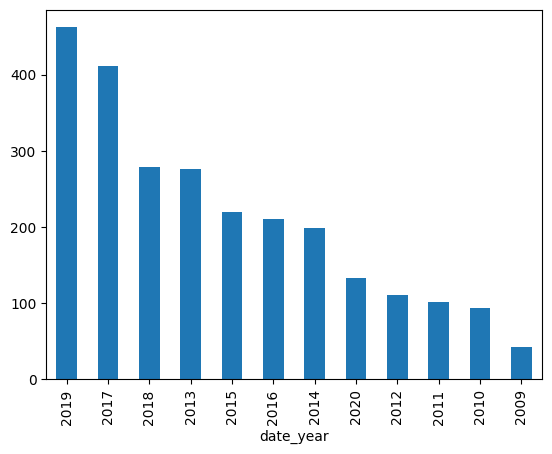

In [115]:
nball['date_year'].value_counts().plot(kind='bar')

In [116]:
nball['match year 2018 or not'] = np.nan
for i in range(2536):
    if nball['date_year'][i] < 2018:
        nball['match year 2018 or not'][i]=0
    else:
        nball['match year 2018 or not'][i]=1

C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_24448\2800438111.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nball['match year 2018 or not'][i]=0
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_24448\2800438111.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nball['match year 2018 or not'][i]=0
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_24448\2800438111.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nball['match year 20

C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_24448\2800438111.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nball['match year 2018 or not'][i]=0
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_24448\2800438111.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nball['match year 2018 or not'][i]=1
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_24448\2800438111.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nball['match year 20

C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_24448\2800438111.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nball['match year 2018 or not'][i]=1
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_24448\2800438111.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nball['match year 2018 or not'][i]=0
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_24448\2800438111.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nball['match year 20

C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_24448\2800438111.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nball['match year 2018 or not'][i]=0
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_24448\2800438111.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nball['match year 2018 or not'][i]=1
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_24448\2800438111.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nball['match year 20

C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_24448\2800438111.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nball['match year 2018 or not'][i]=1
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_24448\2800438111.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nball['match year 2018 or not'][i]=0
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_24448\2800438111.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nball['match year 20

C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_24448\2800438111.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nball['match year 2018 or not'][i]=0
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_24448\2800438111.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nball['match year 2018 or not'][i]=0
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_24448\2800438111.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nball['match year 20

In [117]:
nball.head()

,Innings Player,Opposition,Ground,Innings Wickets Taken,date_year,date_month,last_five_matches_wickets,Average over bowled in 5 mts,total maiden over last 5 mts,Average runs conceed in last 5 mts,Average economy last 5 mts,match year 2018 or not
1399,RA Jadeja,v Sri Lanka,Colombo (RPS),0,2009,2,0.0,7.0,0.0,34.0,4.85,0.0
2141,RA Jadeja,v Sri Lanka,Colombo (RPS),0,2009,2,0.0,7.0,0.0,34.0,4.85,0.0
650,RA Jadeja,v Sri Lanka,Colombo (RPS),0,2009,2,0.0,7.0,0.0,34.0,4.85,0.0
630,RA Jadeja,v West Indies,Kingston,0,2009,6,0.0,7.0,1.0,34.0,4.85,0.0
2121,RA Jadeja,v West Indies,Kingston,0,2009,6,0.0,7.0,2.0,34.0,4.85,0.0


<AxesSubplot: xlabel='date_month'>

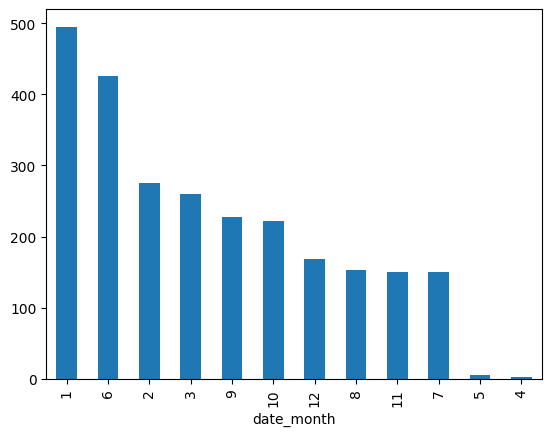

In [118]:
nball['date_month'].value_counts().plot(kind='bar')

In [119]:
nball.corr(numeric_only = True)['Innings Wickets Taken']

Innings Wickets Taken                 1.000000
date_year                            -0.003359
date_month                            0.039238
last_five_matches_wickets             0.606698
Average over bowled in 5 mts          0.194739
total maiden over last 5 mts          0.160366
Average runs conceed in last 5 mts    0.019350
Average economy last 5 mts           -0.096145
match year 2018 or not               -0.027466
Name: Innings Wickets Taken, dtype: float64

In [120]:
nball.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2536 entries, 1399 to 68
Data columns (total 12 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   Innings Player                      2536 non-null   object 
 1   Opposition                          2536 non-null   object 
 2   Ground                              2536 non-null   object 
 3   Innings Wickets Taken               2536 non-null   int64  
 4   date_year                           2536 non-null   int32  
 5   date_month                          2536 non-null   int32  
 6   last_five_matches_wickets           2536 non-null   float64
 7   Average over bowled in 5 mts        2536 non-null   float64
 8   total maiden over last 5 mts        2536 non-null   float64
 9   Average runs conceed in last 5 mts  2536 non-null   float64
 10  Average economy last 5 mts          2536 non-null   float64
 11  match year 2018 or not              2536 non-nu

<AxesSubplot: xlabel='Innings Wickets Taken'>

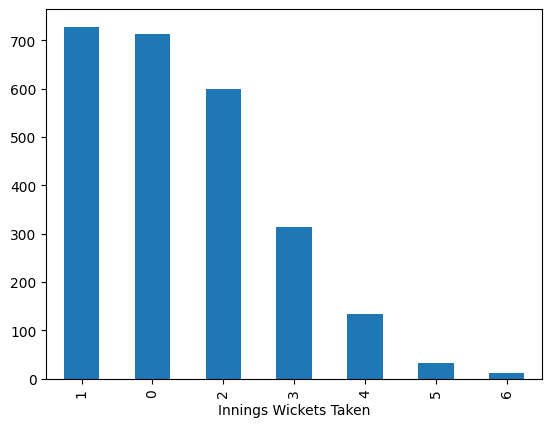

In [121]:
nball['Innings Wickets Taken'].value_counts().plot(kind='bar')

In [122]:
nball['wickets taken'] = np.nan
for i in range(2536):
    if nball['Innings Wickets Taken'][i] >=4:
        nball['wickets taken'][i]=4
    else:
        nball['wickets taken'][i]=nball['Innings Wickets Taken'][i]

C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_24448\3348056405.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nball['wickets taken'][i]=4
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_24448\3348056405.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nball['wickets taken'][i]=4
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_24448\3348056405.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nball['wickets taken'][i]=4
C:\Users\M

C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_24448\3348056405.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nball['wickets taken'][i]=nball['Innings Wickets Taken'][i]
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_24448\3348056405.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nball['wickets taken'][i]=nball['Innings Wickets Taken'][i]
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_24448\3348056405.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returni

C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_24448\3348056405.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nball['wickets taken'][i]=nball['Innings Wickets Taken'][i]
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_24448\3348056405.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nball['wickets taken'][i]=nball['Innings Wickets Taken'][i]
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_24448\3348056405.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returni

C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_24448\3348056405.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nball['wickets taken'][i]=nball['Innings Wickets Taken'][i]
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_24448\3348056405.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nball['wickets taken'][i]=nball['Innings Wickets Taken'][i]
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_24448\3348056405.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returni

C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_24448\3348056405.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nball['wickets taken'][i]=nball['Innings Wickets Taken'][i]
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_24448\3348056405.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nball['wickets taken'][i]=nball['Innings Wickets Taken'][i]
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_24448\3348056405.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returni

C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_24448\3348056405.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nball['wickets taken'][i]=nball['Innings Wickets Taken'][i]
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_24448\3348056405.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nball['wickets taken'][i]=nball['Innings Wickets Taken'][i]
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_24448\3348056405.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returni

C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_24448\3348056405.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nball['wickets taken'][i]=nball['Innings Wickets Taken'][i]
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_24448\3348056405.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nball['wickets taken'][i]=nball['Innings Wickets Taken'][i]
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_24448\3348056405.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returni

C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_24448\3348056405.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nball['wickets taken'][i]=nball['Innings Wickets Taken'][i]
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_24448\3348056405.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nball['wickets taken'][i]=nball['Innings Wickets Taken'][i]
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_24448\3348056405.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returni

C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_24448\3348056405.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nball['wickets taken'][i]=nball['Innings Wickets Taken'][i]
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_24448\3348056405.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nball['wickets taken'][i]=nball['Innings Wickets Taken'][i]
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_24448\3348056405.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returni

In [123]:
nball.head()

,Innings Player,Opposition,Ground,Innings Wickets Taken,date_year,date_month,last_five_matches_wickets,Average over bowled in 5 mts,total maiden over last 5 mts,Average runs conceed in last 5 mts,Average economy last 5 mts,match year 2018 or not,wickets taken
1399,RA Jadeja,v Sri Lanka,Colombo (RPS),0,2009,2,0.0,7.0,0.0,34.0,4.85,0.0,0.0
2141,RA Jadeja,v Sri Lanka,Colombo (RPS),0,2009,2,0.0,7.0,0.0,34.0,4.85,0.0,0.0
650,RA Jadeja,v Sri Lanka,Colombo (RPS),0,2009,2,0.0,7.0,0.0,34.0,4.85,0.0,0.0
630,RA Jadeja,v West Indies,Kingston,0,2009,6,0.0,7.0,1.0,34.0,4.85,0.0,0.0
2121,RA Jadeja,v West Indies,Kingston,0,2009,6,0.0,7.0,2.0,34.0,4.85,0.0,0.0


<AxesSubplot: xlabel='wickets taken'>

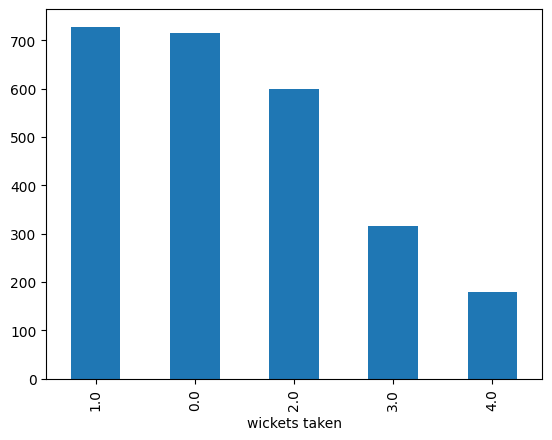

In [124]:
nball['wickets taken'].value_counts().plot(kind='bar')

In [125]:
nball['wickets taken'].value_counts()

wickets taken
1.0    728
0.0    714
2.0    599
3.0    315
4.0    180
Name: count, dtype: int64

In [126]:
nball['Innings Wickets Taken'].value_counts()

Innings Wickets Taken
1    728
0    714
2    599
3    315
4    135
5     33
6     12
Name: count, dtype: int64

In [127]:
away = ['Wellington','Hamilton','Providence','Basseterre','Bridgetown','Colombo (RPS)',
       'Dambulla','Pallekele','Benoni','Centurion','Johannesburg','Durban','Port Elizabeth','Cape Town',
       'Sydney','Adelaide', 'The Oval', 'Birmingham','Melbourne', 'Perth', 'Hobart',
       'Sharjah', 'Abu Dhabi', 'Dubai (DSC)','Bristol', 'Nottingham','Bloemfontein', 'Potchefstroom', 'Brisbane', 'Chester-le-Street',
       'Manchester', 'Taunton', "Lord's", 'Edinburgh', 'Kingstown',
       'Gros Islet', 'Belfast', 'Canberra', 'Auckland', 'Southampton','Leeds',
       'Cardiff', 'Dharamsala', 'Cuttack', 'Port of Spain', 'North Sound',
       'Kingston','Bulawayo','Fatullah', 'Dhaka','Hambantota','Karachi']
india = ['Chennai', 'Bengaluru','Nagpur','Hyderabad (Deccan)','Ranchi', 'Mohali', 'Delhi','Mumbai', 'Rajkot', 'Paarl',
         'Kolkata', 'Indore', 'Pune', 'Jaipur', 'Harare','Kanpur', 'Visakhapatnam', 'Mount Maunganui',
       'Mumbai (BS)', 'Thiruvananthapuram', 'Napier', 'Kochi','Guwahati', 'Vadodara', 'Ahmedabad','Gwalior']

In [128]:
nball['home away'] = np.nan
for i in range(2536):
    if nball['Ground'][i] in away:
        nball['home away'][i]=0
    else:
        nball['home away'][i]=1

C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_24448\2113676616.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nball['home away'][i]=0
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_24448\2113676616.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nball['home away'][i]=0
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_24448\2113676616.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nball['home away'][i]=0
C:\Users\Mrunmay\AppDa

C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_24448\2113676616.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nball['home away'][i]=1
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_24448\2113676616.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nball['home away'][i]=1
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_24448\2113676616.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nball['home away'][i]=0
C:\Users\Mrunmay\AppDa

C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_24448\2113676616.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nball['home away'][i]=1
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_24448\2113676616.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nball['home away'][i]=1
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_24448\2113676616.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nball['home away'][i]=0
C:\Users\Mrunmay\AppDa

C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_24448\2113676616.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nball['home away'][i]=1
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_24448\2113676616.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nball['home away'][i]=1
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_24448\2113676616.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nball['home away'][i]=1
C:\Users\Mrunmay\AppDa

C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_24448\2113676616.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nball['home away'][i]=0
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_24448\2113676616.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nball['home away'][i]=1
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_24448\2113676616.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nball['home away'][i]=1
C:\Users\Mrunmay\AppDa

C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_24448\2113676616.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nball['home away'][i]=0
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_24448\2113676616.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nball['home away'][i]=1
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_24448\2113676616.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nball['home away'][i]=0
C:\Users\Mrunmay\AppDa

In [131]:
nball['oppo'] = np.nan
for i in range(2536):
    if nball['Opposition'][i] in other:
        nball['oppo'][i]=0
    else:
        nball['oppo'][i]=1

C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_24448\2789433629.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nball['oppo'][i]=1
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_24448\2789433629.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nball['oppo'][i]=1
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_24448\2789433629.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nball['oppo'][i]=0
C:\Users\Mrunmay\AppData\Local\Temp\i

C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_24448\2789433629.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nball['oppo'][i]=0
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_24448\2789433629.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nball['oppo'][i]=0
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_24448\2789433629.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nball['oppo'][i]=1
C:\Users\Mrunmay\AppData\Local\Temp\i

C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_24448\2789433629.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nball['oppo'][i]=0
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_24448\2789433629.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nball['oppo'][i]=1
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_24448\2789433629.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nball['oppo'][i]=0
C:\Users\Mrunmay\AppData\Local\Temp\i

In [132]:
nball.head()

,Innings Player,Opposition,Ground,Innings Wickets Taken,date_year,date_month,last_five_matches_wickets,Average over bowled in 5 mts,total maiden over last 5 mts,Average runs conceed in last 5 mts,Average economy last 5 mts,match year 2018 or not,wickets taken,home away,oppo
1399,RA Jadeja,v Sri Lanka,Colombo (RPS),0,2009,2,0.0,7.0,0.0,34.0,4.85,0.0,0.0,0.0,0.0
2141,RA Jadeja,v Sri Lanka,Colombo (RPS),0,2009,2,0.0,7.0,0.0,34.0,4.85,0.0,0.0,0.0,0.0
650,RA Jadeja,v Sri Lanka,Colombo (RPS),0,2009,2,0.0,7.0,0.0,34.0,4.85,0.0,0.0,0.0,0.0
630,RA Jadeja,v West Indies,Kingston,0,2009,6,0.0,7.0,1.0,34.0,4.85,0.0,0.0,0.0,0.0
2121,RA Jadeja,v West Indies,Kingston,0,2009,6,0.0,7.0,2.0,34.0,4.85,0.0,0.0,0.0,0.0


In [133]:
nball.drop(columns=['Opposition','Ground'],inplace=True)

In [134]:
nball.drop(columns=['date_year','date_month'],inplace=True)

In [135]:
nball['Innings Player'].unique()

array(['RA Jadeja', 'R Ashwin', 'JR Hazlewood', 'MA Starc', 'PJ Cummins',
       'Mohammed Shami', 'SA Abbott', 'MP Stoinis', 'JJ Bumrah',
       'A Zampa', 'HH Pandya', 'Kuldeep Yadav', 'SN Thakur',
       'Mohammed Siraj', 'ZE Green'], dtype=object)

In [136]:
fast = ['JR Hazlewood', 'PJ Cummins','MP Stoinis', 'SA Abbott','JJ Bumrah','Mohammed Shami','SN Thakur','HH Pandya', 'Mohammed Siraj', 'MA Starc',
       'ZE Green']
spin = ['A Zampa','Kuldeep Yadav','RA Jadeja','R Ashwin',]

In [137]:
nball['fast or spin'] = np.nan
for i in range(2536):
    if nball['Innings Player'][i] in fast:
        nball['fast or spin'][i]=1
    else:
        nball['fast or spin'][i]=0

C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_24448\3204080281.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nball['fast or spin'][i]=1
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_24448\3204080281.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nball['fast or spin'][i]=1
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_24448\3204080281.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nball['fast or spin'][i]=1
C:\Users\Mrun

C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_24448\3204080281.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nball['fast or spin'][i]=1
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_24448\3204080281.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nball['fast or spin'][i]=1
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_24448\3204080281.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nball['fast or spin'][i]=0
C:\Users\Mrun

C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_24448\3204080281.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nball['fast or spin'][i]=0
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_24448\3204080281.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nball['fast or spin'][i]=1
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_24448\3204080281.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nball['fast or spin'][i]=1
C:\Users\Mrun

C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_24448\3204080281.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nball['fast or spin'][i]=0
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_24448\3204080281.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nball['fast or spin'][i]=1
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_24448\3204080281.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nball['fast or spin'][i]=1
C:\Users\Mrun

C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_24448\3204080281.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nball['fast or spin'][i]=0
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_24448\3204080281.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nball['fast or spin'][i]=0
C:\Users\Mrunmay\AppData\Local\Temp\ipykernel_24448\3204080281.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nball['fast or spin'][i]=1
C:\Users\Mrun

In [138]:
nball.sample(10)

,Innings Player,Innings Wickets Taken,last_five_matches_wickets,Average over bowled in 5 mts,total maiden over last 5 mts,Average runs conceed in last 5 mts,Average economy last 5 mts,match year 2018 or not,wickets taken,home away,oppo,fast or spin
1592,PJ Cummins,1,5.0,10.0,4.0,38.0,3.800,0.0,1.0,1.0,1.0,1.0
1505,PJ Cummins,4,13.0,10.0,2.0,57.6,5.760,1.0,4.0,0.0,1.0,1.0
1509,A Zampa,4,15.0,9.4,1.0,51.6,5.188,1.0,4.0,0.0,0.0,0.0
771,A Zampa,3,13.0,7.6,3.0,39.4,5.084,0.0,3.0,0.0,0.0,0.0
2082,JJ Bumrah,1,6.0,9.6,1.0,78.0,8.340,0.0,1.0,1.0,1.0,1.0
2279,MA Starc,2,12.0,6.0,5.0,24.4,3.400,0.0,2.0,0.0,0.0,1.0
1294,R Ashwin,1,7.0,8.4,7.0,40.4,5.516,0.0,1.0,0.0,0.0,0.0
1806,JJ Bumrah,2,5.0,7.4,4.0,23.6,3.080,1.0,2.0,0.0,0.0,1.0
1764,Mohammed Shami,3,11.0,7.8,0.0,37.8,5.838,1.0,3.0,1.0,1.0,1.0
1770,Kuldeep Yadav,3,11.0,10.0,0.0,42.2,4.220,1.0,3.0,0.0,0.0,0.0


In [139]:
nball.shape

(2536, 12)

In [140]:
nball.reset_index(drop=True,inplace=True)

In [143]:
nball.head(20)

,Innings Player,Innings Wickets Taken,last_five_matches_wickets,Average over bowled in 5 mts,total maiden over last 5 mts,Average runs conceed in last 5 mts,Average economy last 5 mts,match year 2018 or not,wickets taken,home away,oppo,fast or spin
0,RA Jadeja,0,0.0,7.0,0.0,34.0,4.850,0.0,0.0,0.0,0.0,0.0
1,RA Jadeja,0,0.0,7.0,0.0,34.0,4.850,0.0,0.0,0.0,0.0,0.0
2,RA Jadeja,0,0.0,7.0,0.0,34.0,4.850,0.0,0.0,0.0,0.0,0.0
3,RA Jadeja,0,0.0,7.0,1.0,34.0,4.850,0.0,0.0,0.0,0.0,0.0
4,RA Jadeja,0,0.0,7.0,2.0,34.0,4.850,0.0,0.0,0.0,0.0,0.0
5,RA Jadeja,0,0.0,6.6,3.0,36.4,5.574,0.0,0.0,0.0,0.0,0.0
6,RA Jadeja,0,0.0,5.8,3.0,30.8,5.442,0.0,0.0,0.0,0.0,0.0
7,RA Jadeja,0,0.0,5.0,3.0,25.2,5.310,0.0,0.0,0.0,0.0,0.0
8,RA Jadeja,0,0.0,4.0,2.0,20.8,5.540,0.0,0.0,0.0,0.0,0.0
9,RA Jadeja,1,3.0,6.2,1.0,21.8,5.436,0.0,1.0,1.0,1.0,0.0


In [142]:
nball.shape

(2536, 12)

In [145]:
nball.drop("wickets taken",axis=1,inplace=True)

In [146]:
nball.sample()

,Innings Player,Innings Wickets Taken,last_five_matches_wickets,Average over bowled in 5 mts,total maiden over last 5 mts,Average runs conceed in last 5 mts,Average economy last 5 mts,match year 2018 or not,home away,oppo,fast or spin
792,JR Hazlewood,1,5.0,5.2,0.0,21.8,3.97,0.0,0.0,1.0,1.0


In [147]:
nball.to_csv('updated_nball.csv')